In [61]:
# 3rd party
import tensorflow as tf
import lightkurve as lk
import pandas as pd
import numpy as np
from pathlib import Path

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.colors import LogNorm

from scipy.interpolate import interp1d

### Utility functions

In [86]:
# From transit_detection/visualization/utils_plot_examples.py
def plot_ex_flux_window_and_diff_imgs(
    flux_window,
    diff_imgs,
    midpoint,
    is_transit_ex,
    plot_fp,
    norm=False,
    snr=None,
):
    """
    Plot flux and difference image data corresponding to a transit dataset example.

    Args:
        flux: NumPy array, flux window
        diff_imgs: list/tuple of NumPy arrays, in order: [diff_img,oot_img,snr_img,target_img]
        midpoint: float, time t corresponding to the midpoint of the flux window example
        is_transit_ex: boolean, True if example corresponds to a transit
        plot_fp: Path, file path to saved plot
        norm: bool, changes plot titles and diff_img plot scales
        snr: float, coresponding to tce_model_snr

    Returns:
        None
    """

    (diff_img, oot_img, snr_img, target_img) = diff_imgs

    label = "In Transit" if is_transit_ex else "Out of Transit"

    snr = str(round(snr, 2)) if snr else None
    it_idx = np.argmax(target_img)
    row, col = np.unravel_index(
        it_idx, target_img.shape
    )  # Get row and col as if array were flattened
    target_coords = {"x": row, "y": col}
    fig = plt.figure(figsize=(16, 16))
    gs = gridspec.GridSpec(3, 2, figure=fig)
    ax = fig.add_subplot(gs[0, :])
    time = np.linspace(0, 100, 100)
    ax.plot(time, flux_window, linestyle="None", marker="o", markersize=3, alpha=0.6)
    ax.set_title(
        f"{label} Flux Window w/ midpoint {round(midpoint,2) if midpoint else None} Over Time"
    )
    ax.set_xlabel("Time")
    ax.set_ylabel("Flux value") if not norm else ax.set_ylabel("Normalized Flux value")

    # diff imgs
    ax = fig.add_subplot(gs[1, 0])
    im = ax.imshow(diff_img, norm=None)
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    plt.colorbar(im, cax=cax)
    ax.scatter(
        target_coords["y"], target_coords["x"], marker="x", color="r", label="Target"
    )
    ax.set_ylabel("Row")
    ax.set_xlabel("Col")
    ax.legend()
    (
        ax.set_title("Difference Flux (e-/cadence)")
        if not norm
        else ax.set_title("Normalized Difference Flux")
    )
    # oot img
    ax = fig.add_subplot(gs[1, 1])
    im = ax.imshow(oot_img, norm=LogNorm() if not norm else None)
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    plt.colorbar(im, cax=cax)
    ax.scatter(
        target_coords["y"], target_coords["x"], marker="x", color="r", label="Target"
    )
    ax.set_ylabel("Row")
    ax.set_xlabel("Col")
    ax.legend()
    (
        ax.set_title("Out-of-Transit Flux (e-/cadence)")
        if not norm
        else ax.set_title("Normalized Out-of-Transit Flux")
    )
    # target img
    ax = fig.add_subplot(gs[2, 0])
    ax.imshow(target_img)
    ax.set_ylabel("Row")
    ax.set_xlabel("Col")
    ax.set_title("Target Position")
    # snr img
    ax = fig.add_subplot(gs[2, 1])
    im = ax.imshow(snr_img, norm=LogNorm() if not norm else None)
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    plt.colorbar(im, cax=cax)
    ax.scatter(
        target_coords["y"], target_coords["x"], marker="x", color="r", label="Target"
    )
    ax.set_ylabel("Row")
    ax.set_xlabel("Col")
    ax.legend()
    (
        ax.set_title(f"Difference SNR: {snr}")
        if not norm
        else ax.set_title(f"Normalized Difference SNR: {snr}")
    )
    plt.tight_layout()

    try:
        plt.savefig(plot_fp)
        plt.close()

        print(f"Saved plots figures to {plot_fp}")
    except Exception as e:
        print(f"ERROR: plotting: {e}")


### Visualizing flux window examples from tfrecord on lightcurve

In [ ]:
tfrec_fp = "/Users/jochoa4/Desktop/datasets/TESS_exoplanet_dataset_06-18-2025_test_group_raw/raw_shard_0001-0001.tfrecord"

plot_dir = Path("/Users/jochoa4/Desktop/plots/visualize_flux_examples_06-20-2025/")
plot_dir.mkdir(parents=True, exist_ok=True)

In [87]:
tfrec_dataset = tf.data.TFRecordDataset(tfrec_fp)

for str_record in tfrec_dataset.as_numpy_iterator():
    example = tf.train.Example()
    example.ParseFromString(str_record)

    # get example info
    label = example.features.feature["label"].bytes_list.value[0].decode("utf-8")
    uid = example.features.feature["uid"].bytes_list.value[0].decode("utf-8")
    midpoint = example.features.feature["t"].float_list.value[0]

    # get ephemerides/tce data
    disposition = example.features.feature["disposition"].bytes_list.value[0].decode("utf-8") # fmt: skip
    tce_period = example.features.feature["tce_period"].float_list.value[0]
    tce_model_snr = example.features.feature["tce_model_snr"].float_list.value[0]
    tce_uid = uid.split("_")[0]
    target_id = tce_uid.split("-")[0]
    sector_run = tce_uid.split("S")[-1]
    sector = example.features.feature["sector"].bytes_list.value[0].decode("utf-8")

    # get flux window
    flux_window = example.features.feature["flux"].float_list.value

    # get diff_imgs
    diff_imgs = []
    for img_feature in ["diff_img", "oot_img", "snr_img", "target_img"]:
        example_img_feature = tf.reshape(
            tf.io.parse_tensor(
                example.features.feature[img_feature].bytes_list.value[0],
                tf.float32,
            ),
            (33, 33),
        ).numpy()
        diff_imgs.append(example_img_feature)

    t_sr_s_plot_dir = plot_dir / target_id / sector_run / sector
    t_sr_s_plot_dir.mkdir(parents=True, exist_ok=True)
    
    plot_fp = t_sr_s_plot_dir / f"t_{round(midpoint, 2)}_{disposition}_{tce_uid}_{label}.png"

    assert label in ("1", "0"), "ERROR: example label {label}: {type(label)} does not meeted expected format"
    plot_ex_flux_window_and_diff_imgs(
                    flux_window=flux_window,
                    diff_imgs=diff_imgs,
                    midpoint=midpoint,
                    is_transit_ex=(True if label == "1" else False),
                    plot_fp=plot_fp,
                    norm=False,
                    snr=None,
                )

Saved plots figures to /Users/jochoa4/Desktop/plots/visualize_flux_examples_06-07-2025/30034081/7/7/t_1493.6_EB_30034081-3-S7_1.png
Saved plots figures to /Users/jochoa4/Desktop/plots/visualize_flux_examples_06-07-2025/30034081/7/7/t_1495.95_EB_30034081-3-S7_1.png
Saved plots figures to /Users/jochoa4/Desktop/plots/visualize_flux_examples_06-07-2025/30034081/7/7/t_1498.3_EB_30034081-3-S7_1.png
Saved plots figures to /Users/jochoa4/Desktop/plots/visualize_flux_examples_06-07-2025/30034081/7/7/t_1500.64_EB_30034081-3-S7_1.png
Saved plots figures to /Users/jochoa4/Desktop/plots/visualize_flux_examples_06-07-2025/30034081/7/7/t_1502.99_EB_30034081-3-S7_1.png
Saved plots figures to /Users/jochoa4/Desktop/plots/visualize_flux_examples_06-07-2025/30034081/7/7/t_1505.34_EB_30034081-3-S7_1.png
Saved plots figures to /Users/jochoa4/Desktop/plots/visualize_flux_examples_06-07-2025/30034081/7/7/t_1507.69_EB_30034081-3-S7_1.png
Saved plots figures to /Users/jochoa4/Desktop/plots/visualize_flux_exam

Looking @ TCE: 

In [ ]:
target, sector_run = 198242678, "14-19" # 30034081, "7"

In [97]:
sector_run_arr = []

if "-" in sector_run:
    start_sector, end_sector = [
        int(sector) for sector in sector_run.split("-")
    ]
    sector_run_arr = [
        sector for sector in range(start_sector, end_sector + 1)
    ]
else:
    sector_run_arr = [int(sector_run)]

# find light curve data for target, sector_run pair
search_lc_res = lk.search_lightcurve(
    target=f"tic{target}",
    mission="TESS",
    author=("TESS-SPOC", "SPOC"),
    exptime=120,
    cadence="long",
    sector=sector_run_arr,
)

In [100]:
lcfs = search_lc_res.download_all(
    quality_bitmask="default", flux_column="pdcsap_flux"
)

5


In [101]:
for lcf in lcfs:
    print(lcf.quality.value)

[0 0 0 ... 0 0 0]
[    0     0     0 ... 32768 32768 32768]
[   0    0    0 ... 4096 4096 4096]
[512   0   0 ...  16  16  16]
[ 0  0  0 ... 16 16 16]


In [63]:
def resample_timeseries(time, flux, num_resampled_points):

    f = interp1d(
        time, flux, kind="nearest", bounds_error=False, fill_value="extrapolate"
    )

    resampled_time = np.linspace(time[0], time[-1], num=num_resampled_points)

    resampled_flux = f(resampled_time)

    return resampled_time, resampled_flux

In [ ]:
def fill_timeseries_gaps(time, flux, num_resampled_points):
    """Fill skips in cadences for time series and populate flux with nan values"""

    dt = np.diff(time)
    assert np.all(dt >= 0), "Time series must be sorted"

    expected_cadence = 2 / 1440

    threshold = 2 * (expected_cadence) # skips 2 cadences
    start_gap_idxs = np.where(dt > threshold)[0]

    filled_time = np.array([])

    for gap_idx in start_gap_idxs:
        start = time[gap_idx]
        end = time[gap_idx + 1]
        
        n_insert = int(np.floor((end - start) / expected_cadence)) # - 1
        if n_insert > 0:
            new_cadences = start + expected_cadence * np.arange(1, n_insert + 1)
            filled_time.extend(time)
    f = interp1d(
        time, flux, kind="nearest", bounds_error=False, fill_value="extrapolate"
    )

    resampled_time = np.linspace(time[0], time[-1], num=num_resampled_points)

    resampled_flux = f(resampled_time)

    return resampled_time, resampled_flux

is_fin1: [ True  True  True ...  True  True  True], is_fin1: [  ———   ———   ——— ...  True  True  True]
is_fin2: [ True  True  True ...  True  True  True], is_fin2: [False False False ...  True  True  True]
[ 2260  4498  6741  8170 10439 12681 14924]
[1492.36724593 1492.36863481 1492.37002369 1492.37141257 1492.37280145
 1492.37557922 1492.3769681  1492.37835698 1492.37974586 1492.3839125
 1492.38530138 1492.38669026 1492.38807914 1492.38946802 1492.3908569
 1492.39224579 1492.39363467 1492.39502355 1492.39641243 1492.39780131]
[1492.37835698 1492.37974586 1492.3839125 ]
[1503.03246326 1503.03385214 1503.03524101 1503.03662989 1504.70467441]
[1.38887853e-03 1.38887853e-03 1.38887853e-03 1.66804452e+00
 1.38888365e-03 1.38888365e-03 1.38888371e-03]
[0.00138888 0.00138888 0.00138888 ... 0.00138888 0.00138888 0.00138888]
(array([8627]),)


<Figure size 1000x200 with 0 Axes>

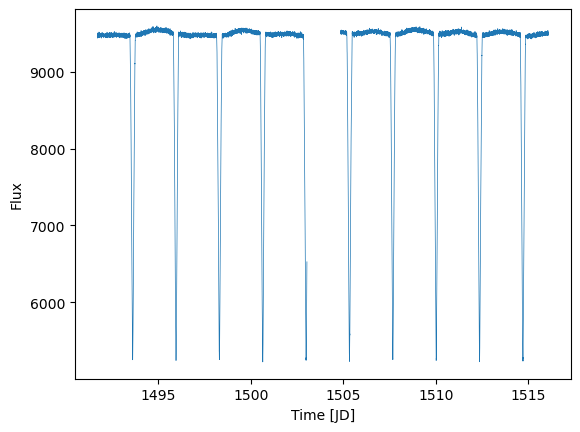

s: 1503.6040552746163, m: 1505.3387228787828, e: 1507.0733904829494)
s_a: 1.7346676041665887, m: 1505.3387228787828, e_a: 1.7346676041665887)
prior_times: [1503.02412999 1503.02551886 1503.02690774 1503.02829662 1503.0296855
 1503.03107438 1503.03246326 1503.03385214 1503.03524101 1503.03662989
 1504.70467441 1504.70606329 1504.70745218 1504.70884106 1504.71022994
 1504.71161883 1504.71300771 1504.71439659 1504.71578548 1504.71717436] 
prior_diff: [1.38887853e-03 1.38887853e-03 1.38887859e-03 1.38887853e-03
 1.38887853e-03 1.38887853e-03 1.38887853e-03 1.38887853e-03
 1.38887853e-03 1.66804452e+00 1.38888365e-03 1.38888365e-03
 1.38888371e-03 1.38888365e-03 1.38888371e-03 1.38888365e-03
 1.38888371e-03 1.38888365e-03 1.38888371e-03] 
prior_diff_mins: [1.99998509e+00 1.99998508e+00 1.99998517e+00 1.99998509e+00
 1.99998509e+00 1.99998508e+00 1.99998508e+00 1.99998509e+00
 1.99998508e+00 2.40198410e+03 1.99999246e+00 1.99999246e+00
 1.99999255e+00 1.99999246e+00 1.99999254e+00 1.99999246

<Figure size 1000x200 with 0 Axes>

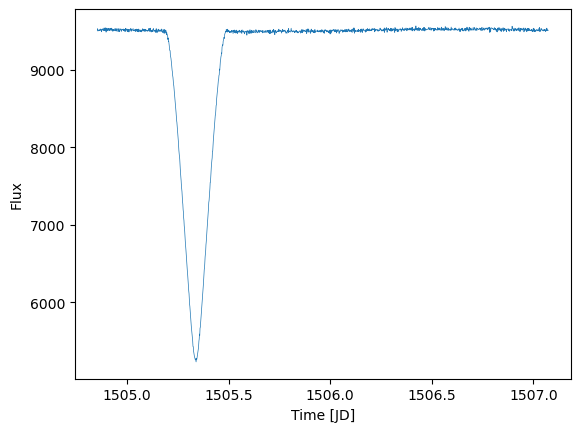

valid_time_idxs: [ True  True  True ...  True  True  True], len: 16343
valid_flux_idxs: [False False False ...  True  True  True], len: 16343
idxs_window: [False False False ... False False False], len: 16343
valid_idxs_data: [False False False ...  True  True  True], len: 16343
pos_tw: [1504.70467441 1504.70606329 1504.70745218 ... 1507.06994508 1507.07133397
 1507.07272285]
tw: (1504.853284978462, 1507.072722852543)
fw: (9518.321, 9513.828)


<Figure size 1000x200 with 0 Axes>

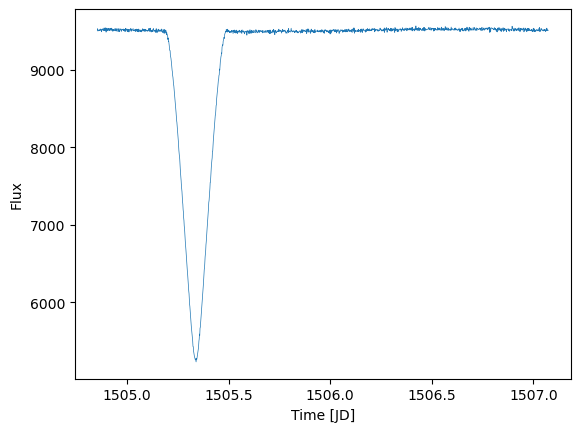

<Figure size 1000x200 with 0 Axes>

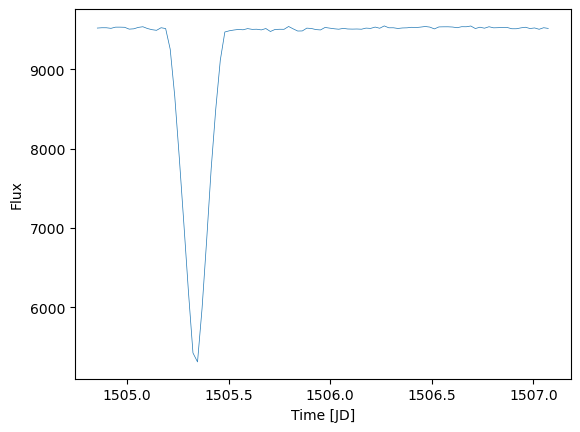

[9518.321  9522.282  9522.041  9514.915  9529.789  9529.967  9528.088
 9504.751  9508.844  9526.931  9534.975  9512.625  9497.931  9489.919
 9522.577  9512.049  9252.195  8658.915  7883.0396 7054.0254 6202.8633
 5426.676  5313.8447 5991.181  6842.483  7749.6606 8496.538  9113.667
 9468.875  9484.2295 9493.909  9500.861  9496.626  9511.485  9501.991
 9503.67   9495.171  9512.403  9475.158  9500.373  9503.225  9502.839
 9538.238  9508.295  9480.981  9482.086  9517.467  9513.057  9499.089
 9494.673  9525.968  9517.586  9509.402  9503.778  9514.271  9506.639
 9505.155  9506.534  9503.785  9517.9795 9514.072  9530.838  9515.87
 9545.294  9521.733  9522.027  9513.223  9519.665  9521.308  9528.02
 9524.971  9530.651  9537.999  9530.555  9507.753  9532.722  9534.0625
 9534.227  9531.303  9522.685  9535.393  9534.617  9544.212  9512.334
 9529.1    9516.539  9535.0625 9521.328  9523.068  9525.367  9525.394
 9509.567  9509.579  9520.816  9528.621  9512.506  9519.927  9502.986
 9522.719  9513.828 

In [83]:
for lcf in lcfs:
    # lcf2 = lk.LightCurve(
    #     {"time": np.array(lcf.time.value), "flux": np.array(lcf.flux.value)}
    # )  # np array accounts for masked flux
    print(f"is_fin1: {np.isfinite(lcf.time.value)}, is_fin1: {np.isfinite(lcf.flux.value)}")
    lcf = lk.LightCurve(
                    {"time": np.array(lcf.time.value), "flux": np.array(lcf.flux.value)}
                )  # np array accounts for masked flux
    
    raw_time, raw_flux = lcf.time.value, lcf.flux.value
    print(f"is_fin2: {np.isfinite(lcf.time.value)}, is_fin2: {np.isfinite(lcf.flux.value)}")

    time_diff = np.diff(raw_time)
    where = np.where(time_diff > (5 * (2 / 1440)))[0]
    print(where)

    print(f"max_time_diff_mins: {np.max(np.diff(raw_time))}")

    plt.figure(figsize=(10,2))
    f, ax = plt.subplots()
    lcf.plot(ax=ax)
    plt.show()
    
    tce_duration = 16.652809 / 24
    # s, m, e = (1504.9741395454496, 1505.3387228787828, 1505.7033062121161)
    m = 1505.3387228787828
    s, e = (m - 5 * tce_duration / 2), (m + 5 * tce_duration / 2)
    print(f"s: {s}, m: {m}, e: {e})")
    print(f"s_a: {np.abs(m - s)}, m: {m}, e_a: {np.abs(m - e)})")
    # left_idxs = np.where((raw_time >= s) & (raw_time <= e))
    # right_idxs = 
    

    win_idxs = np.where((raw_time >= s) & (raw_time <= e))[0]
    first_idx = win_idxs[0]
    print(f"prior_times: {raw_time[(first_idx - 10):(first_idx + 10)]} ")
    print(f"prior_diff: {np.diff(raw_time[(first_idx - 10):(first_idx + 10)])} ")
    print(f"prior_diff_mins: {np.diff(raw_time[(first_idx - 10):(first_idx + 10)]) * 1440}")
    print(f"max_diff: {np.max(np.diff(raw_time[(first_idx - 10):(first_idx + 10)]))}")
    print(f"max_diff_mins: {np.max(np.diff(raw_time[(first_idx - 10):(first_idx + 10)])) * 1440}")

    left_idxs = np.where((raw_time >= s) & (raw_time <= m))[0]
    right_idxs = np.where((raw_time >= m) & (raw_time <= e))[0]
    it_left_idxs = np.where((raw_time >= (m - tce_duration / 2)) & (raw_time <= m))[0]
    it_right_idxs = np.where((raw_time >= m) & (raw_time <= (m + tce_duration / 2)))[0]
    t_idxs = np.where((raw_time >= (m - tce_duration / 2)) & (raw_time <= (m + tce_duration / 2)))[0]
    print(f"left_i: {len(left_idxs)}, right_i: {len(right_idxs)}")
    print(f"it_left_i: {len(it_left_idxs)}, it_right_i: {len(it_right_idxs)}")
    print(f"it_i: {len(t_idxs)}")
    

    left_diff = np.diff(raw_time[left_idxs])
    right_diff = np.diff(raw_time[right_idxs])
    print(f"avg_left_diff_mins: {np.average(left_diff) * 1440}, avg_right_diff_mins: {np.average(right_diff) * 1440}")
    print(f"max_left_diff_mins: {np.max(left_diff) * 1440}, max_right_diff_mins: {np.max(right_diff) * 1440}")

    print(f"l_f: {np.isfinite(raw_time[left_idxs])}")
    print(f"it_f: {np.isfinite(raw_time[t_idxs])}")
    win_time = raw_time[win_idxs]
    win_flux = raw_flux[win_idxs]
    win_lcf = lk.LightCurve(
                    {"time": win_time, "flux": win_flux}
                )  # np array accounts for masked flux
    print(f"s: {win_time[0]}, m: {win_time[len(win_time) // 2]}, e: {win_time[-1]}")
    print(f"s_f: {win_flux[0]}, m_f: {win_flux[len(win_flux) // 2]}, e_f: {win_flux[-1]}")
    plt.figure(figsize=(10,2))
    f, ax = plt.subplots()
    win_lcf.plot(ax=ax)
    plt.show()
    

    idxs_window = np.logical_and(raw_time >= s, raw_time <= e)
    idxs_it_window = np.logical_and(
            raw_time >= m - tce_duration / 2,
            raw_time <= m + tce_duration / 2,
        )

    valid_time_idxs = np.isfinite(raw_time)
    valid_flux_idxs = np.isfinite(raw_flux)
    print(f"valid_time_idxs: {valid_time_idxs}, len: {len(valid_time_idxs)}")
    print(f"valid_flux_idxs: {valid_flux_idxs}, len: {len(valid_flux_idxs)}")

    valid_idxs_data = np.logical_and(valid_time_idxs, valid_flux_idxs)
    print(f"idxs_window: {idxs_window}, len: {len(idxs_window)}")
    print(f"valid_idxs_data: {valid_idxs_data}, len: {len(valid_idxs_data)}")

    print(f"pos_tw: {raw_time[(idxs_window)]}")

    time_window = raw_time[(idxs_window & valid_idxs_data)]
    flux_window = raw_flux[(idxs_window & valid_idxs_data)]

    print(f"tw: {time_window[0], time_window[-1]}")
    print(f"fw: {flux_window[0], flux_window[-1]}")
    
    lcf_win2 = lk.LightCurve(
                    {"time": time_window, "flux": flux_window}
                )  # np array accounts for masked flux
    
    plt.figure(figsize=(10,2))
    f, ax = plt.subplots()
    lcf_win2.plot(ax=ax)
    plt.show()
    # time, flux = lcf["time"], lcf["flux"]

    resampled_time_window, resampled_flux_window = resample_timeseries(
            time_window, flux_window, 100
        )
    
    lcf_win_resampled = lk.LightCurve(
                    {"time": resampled_time_window, "flux": resampled_flux_window}
                )  # np array accounts for masked flux

    plt.figure(figsize=(10,2))
    f, ax = plt.subplots()
    lcf_win_resampled.plot(ax=ax)
    plt.show()

    print(resampled_flux_window)
    print(resampled_time_window)
    
    
    # t0 = time[0]
    
    # np.isfinite(flux)
    



In [ ]:
# load tce_tbl

In [ ]:
def build_transit_mask_for_lightcurve(
    time,
    tce_list,
    n_durations_window: int = 3,
    maxmes_threshold: float = 7.1,
):
    in_transit_mask = np.zeros(len(time), dtype=bool)

    for tce in tce_list:
        epoch = tce["tce_time0bk"]
        period = tce["tce_period"]
        duration = tce["tce_duration"]
        maxmes = tce["tce_maxmes"]
        maxmesd = tce["tce_maxmesd"]

        duration /= 24  # convert hours to days

        # distance to nearest transit center
        transit_proximity_days = ((time - epoch + (period / 2)) % period) - (period / 2)
        in_transit_mask |= np.abs(transit_proximity_days) <= (
            ((n_durations_window * duration) / 2)
        )  # mask for primary transit

        if maxmes > maxmes_threshold:
            sec_epoch = epoch + maxmesd
            # distance to nearest potential secondary transit center
            sec_transit_proximity_days = (
                (time - sec_epoch + (period / 2)) % period
            ) - (period / 2)
            in_transit_mask |= np.abs(sec_transit_proximity_days) <= (
                ((n_durations_window * duration) / 2)
            )  # mask for potential secondary transit
    return in_transit_mask

ERROR: plotting: [Errno 2] No such file or directory: '/Users/jochoa4/Desktop/plots/visualize_flux_examples_06-07-2025/30034081/7/7/examples/t_1493.6_EB_30034081-3-S7_1.png'
ERROR: plotting: [Errno 2] No such file or directory: '/Users/jochoa4/Desktop/plots/visualize_flux_examples_06-07-2025/30034081/7/7/examples/t_1495.95_EB_30034081-3-S7_1.png'
ERROR: plotting: [Errno 2] No such file or directory: '/Users/jochoa4/Desktop/plots/visualize_flux_examples_06-07-2025/30034081/7/7/examples/t_1498.3_EB_30034081-3-S7_1.png'
ERROR: plotting: [Errno 2] No such file or directory: '/Users/jochoa4/Desktop/plots/visualize_flux_examples_06-07-2025/30034081/7/7/examples/t_1500.64_EB_30034081-3-S7_1.png'
ERROR: plotting: [Errno 2] No such file or directory: '/Users/jochoa4/Desktop/plots/visualize_flux_examples_06-07-2025/30034081/7/7/examples/t_1502.99_EB_30034081-3-S7_1.png'
ERROR: plotting: [Errno 2] No such file or directory: '/Users/jochoa4/Desktop/plots/visualize_flux_examples_06-07-2025/30034081

/var/folders/_z/srkh35f94rd_6jrkc3kv29hm0000gp/T/ipykernel_60087/3913791896.py:37: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(16, 16))


ERROR: plotting: [Errno 2] No such file or directory: '/Users/jochoa4/Desktop/plots/visualize_flux_examples_06-07-2025/198242678/14-19/16/examples/t_1757.15_EB_198242678-1-S14-19_1.png'
ERROR: plotting: [Errno 2] No such file or directory: '/Users/jochoa4/Desktop/plots/visualize_flux_examples_06-07-2025/198242678/14-19/16/examples/t_1761.79_EB_198242678-1-S14-19_1.png'
ERROR: plotting: [Errno 2] No such file or directory: '/Users/jochoa4/Desktop/plots/visualize_flux_examples_06-07-2025/198242678/14-19/16/examples/t_1758.48_EB_198242678-1-S14-19_0.png'
ERROR: plotting: [Errno 2] No such file or directory: '/Users/jochoa4/Desktop/plots/visualize_flux_examples_06-07-2025/198242678/14-19/16/examples/t_1760.34_EB_198242678-1-S14-19_0.png'
ERROR: plotting: [Errno 2] No such file or directory: '/Users/jochoa4/Desktop/plots/visualize_flux_examples_06-07-2025/198242678/14-19/16/examples/t_1753.52_EB_198242678-1-S14-19_0.png'
ERROR: plotting: [Errno 2] No such file or directory: '/Users/jochoa4/

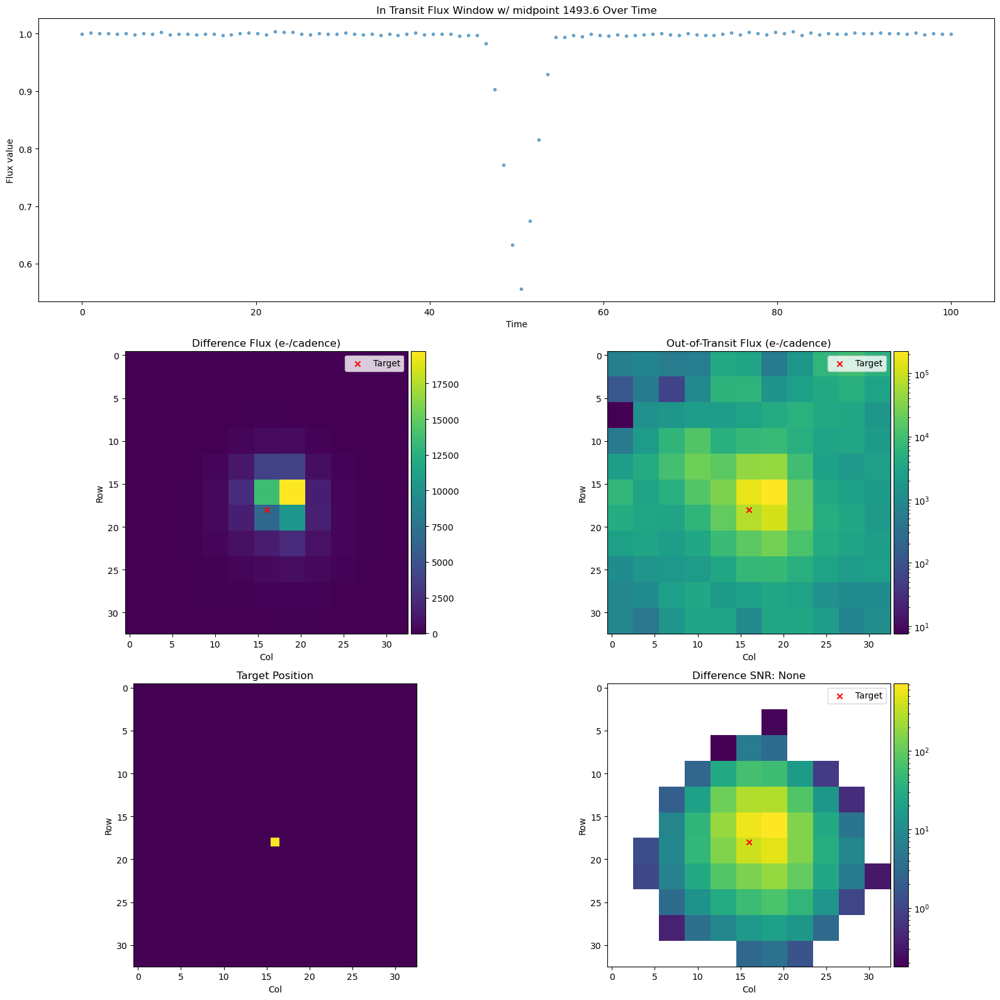

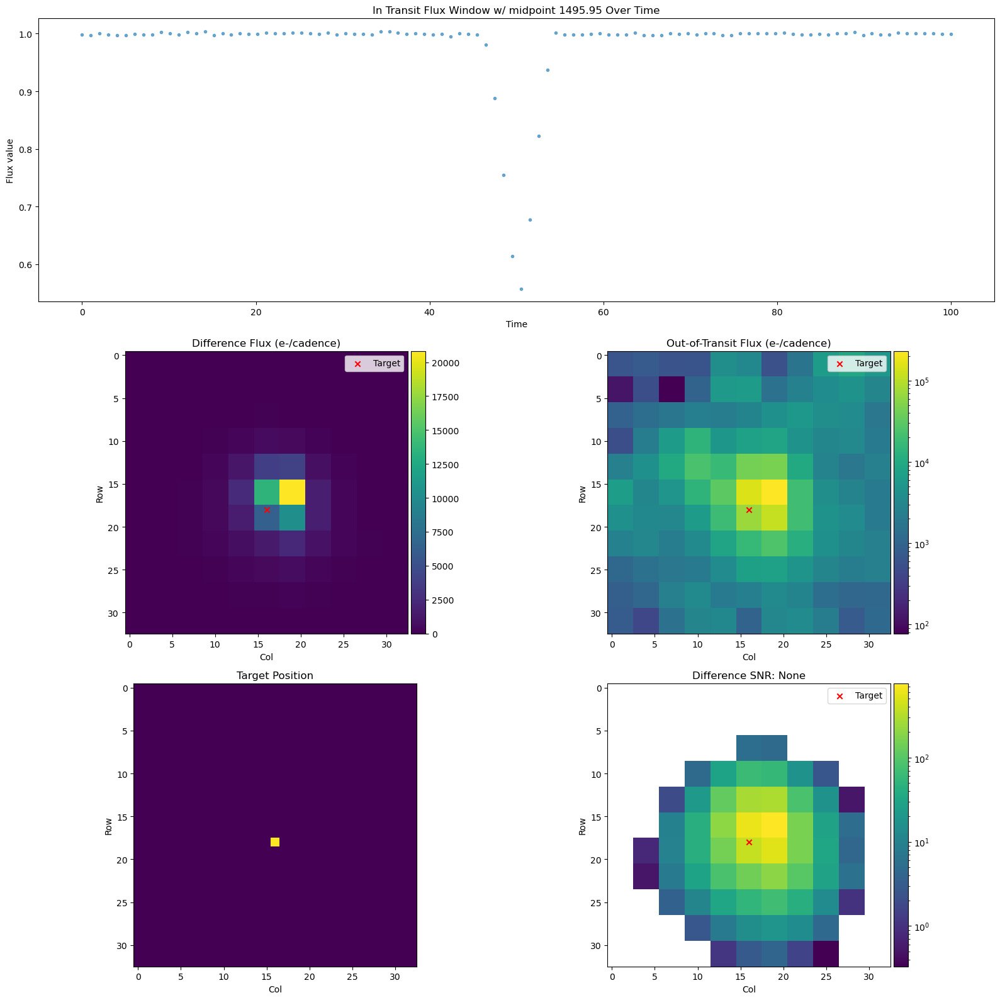

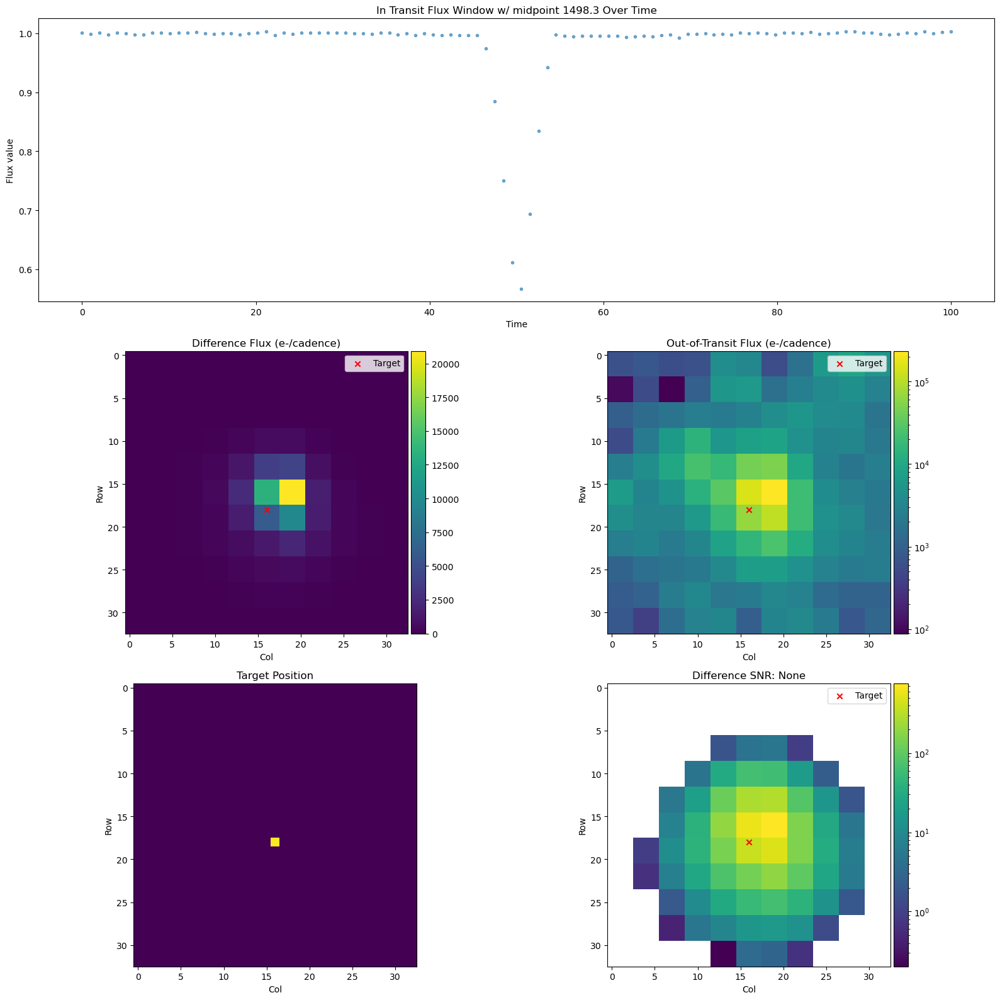

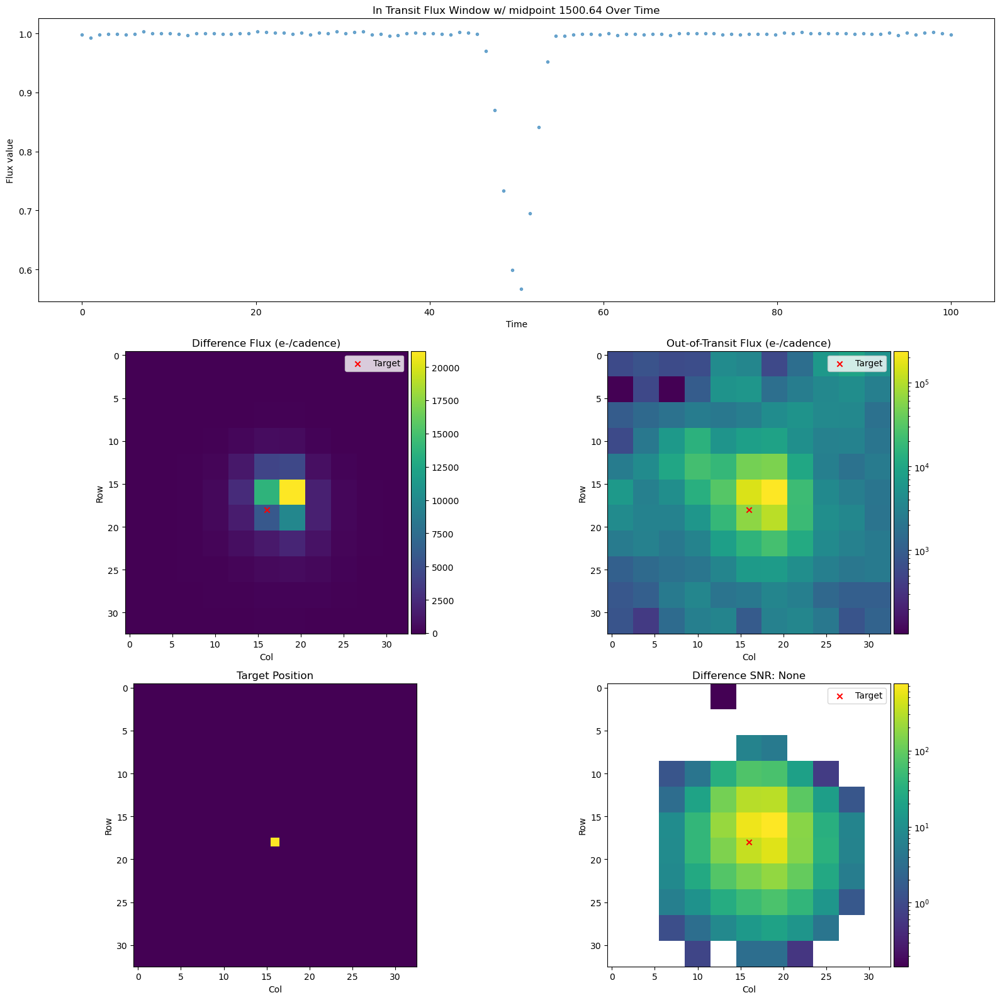

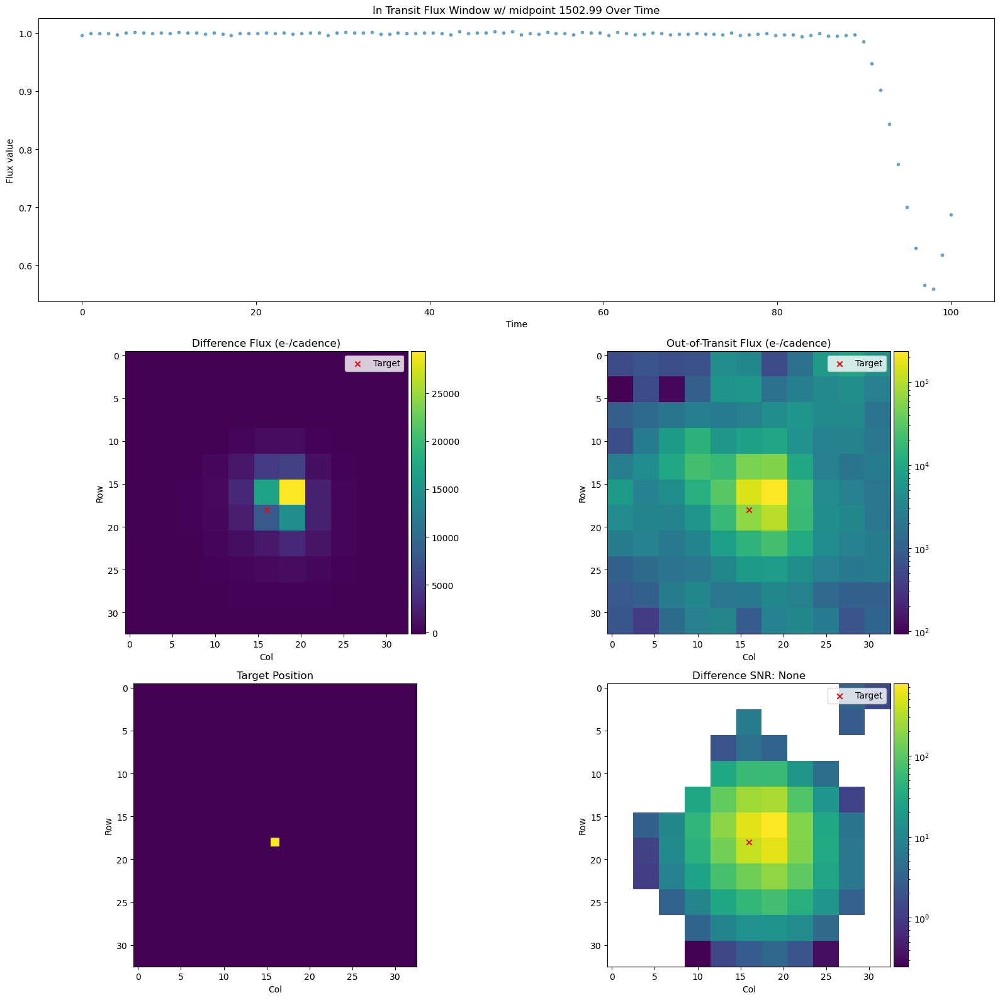

...

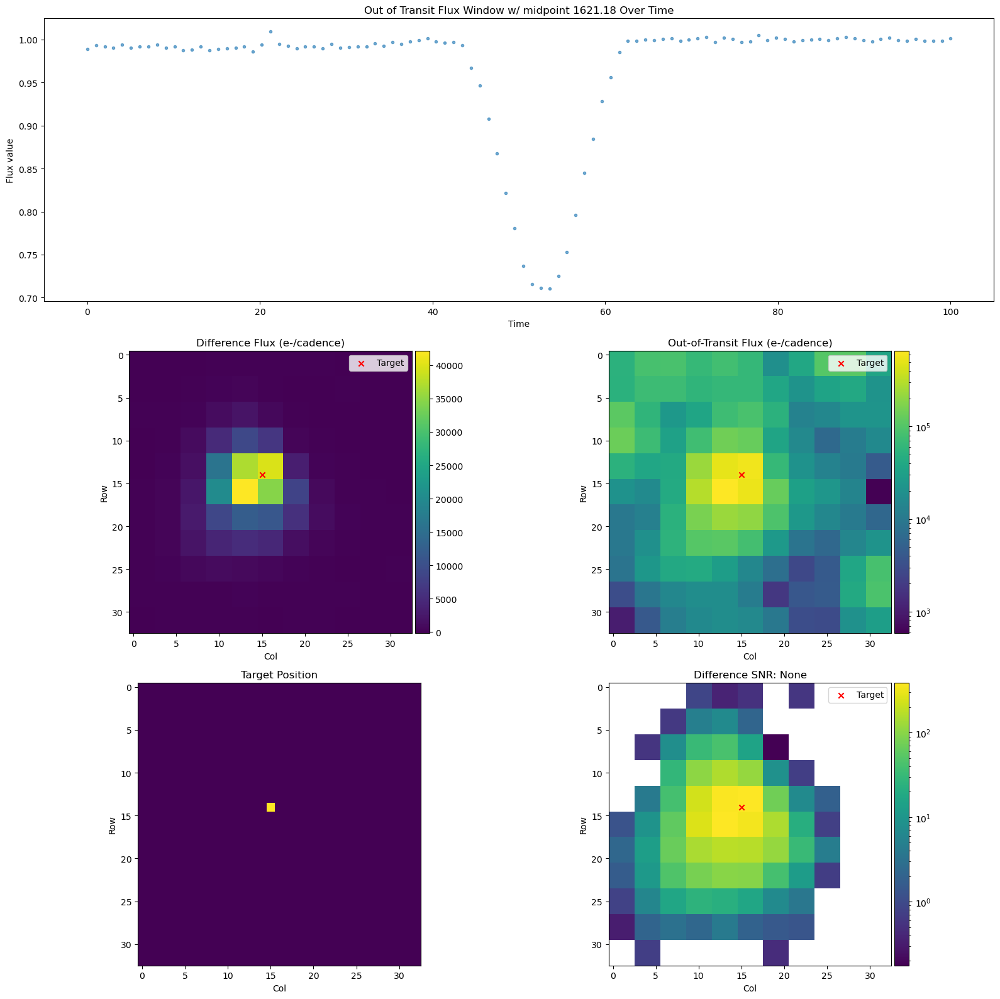

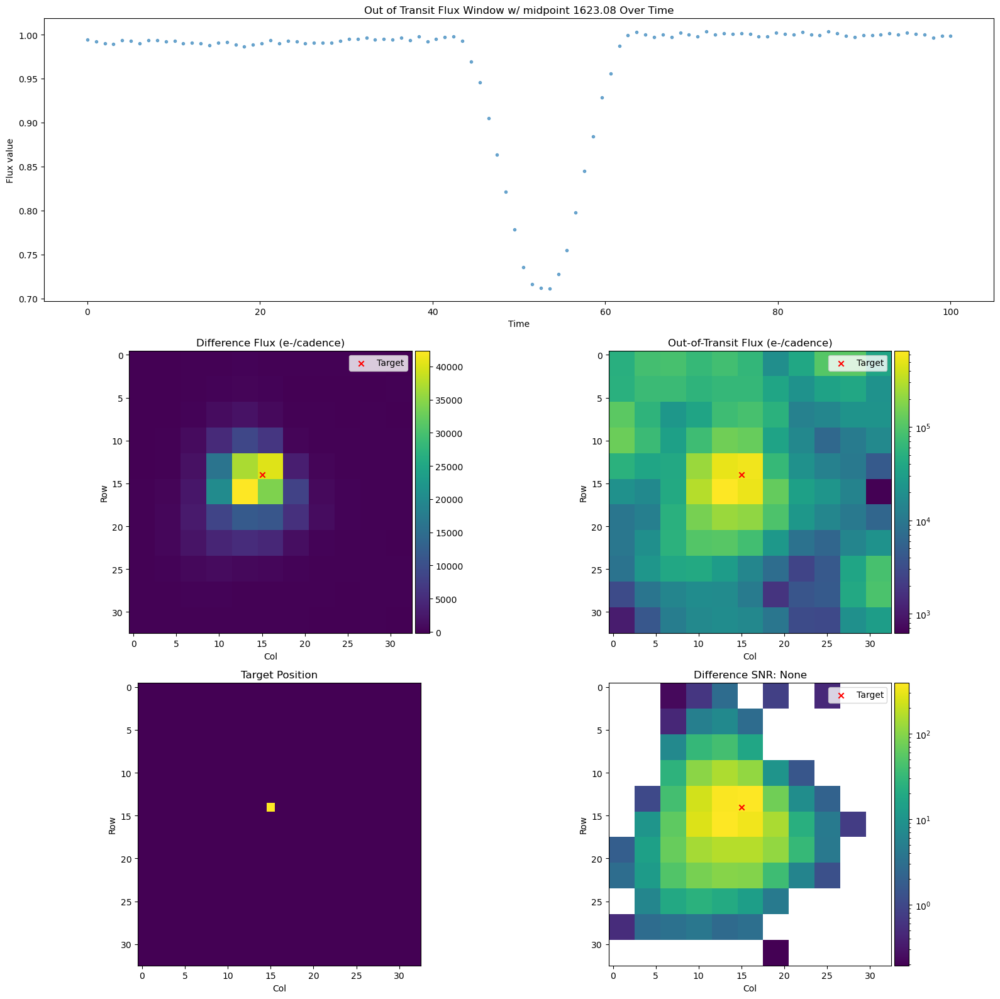

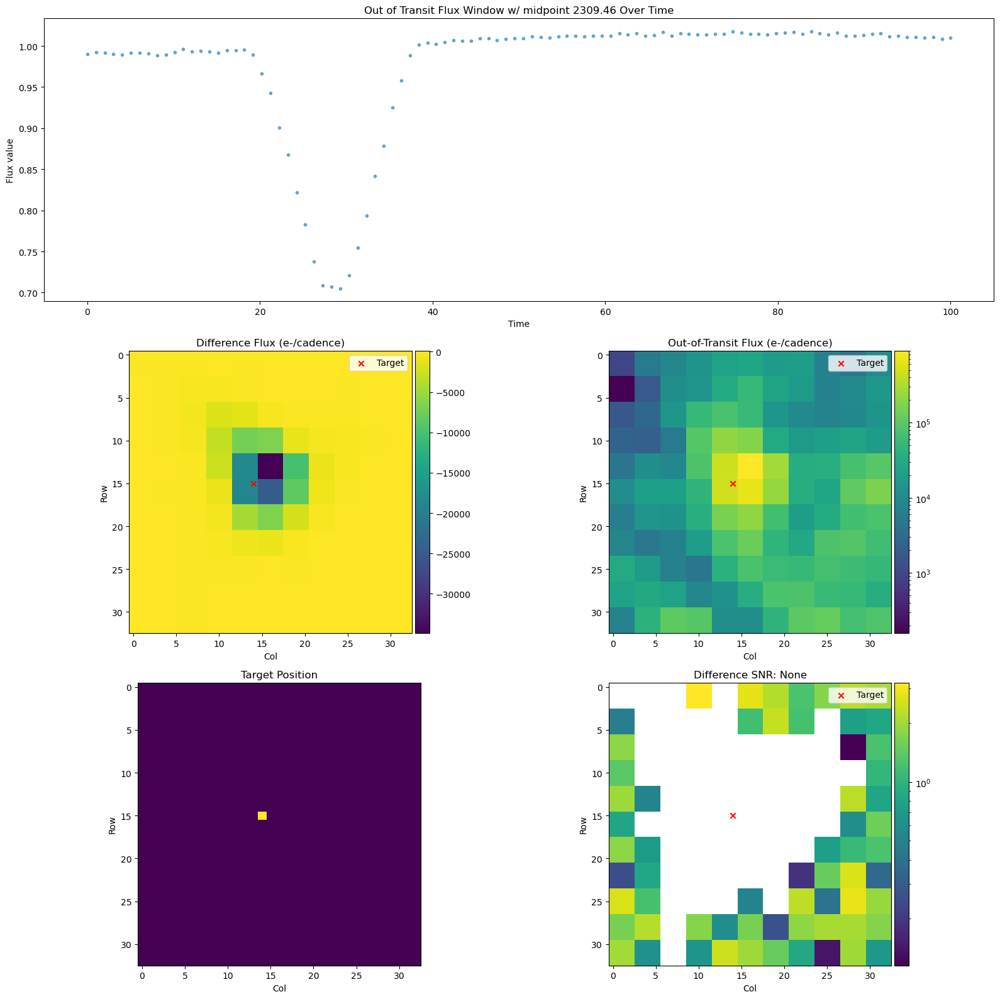

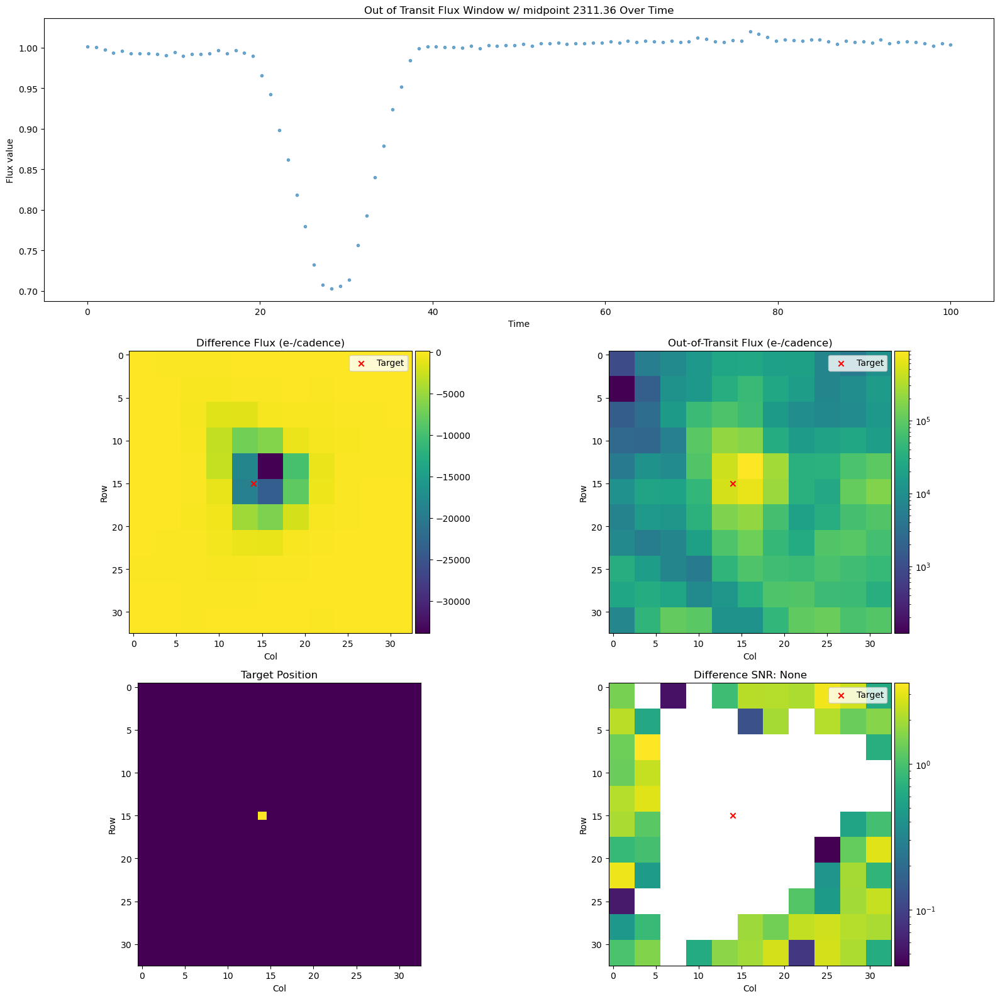

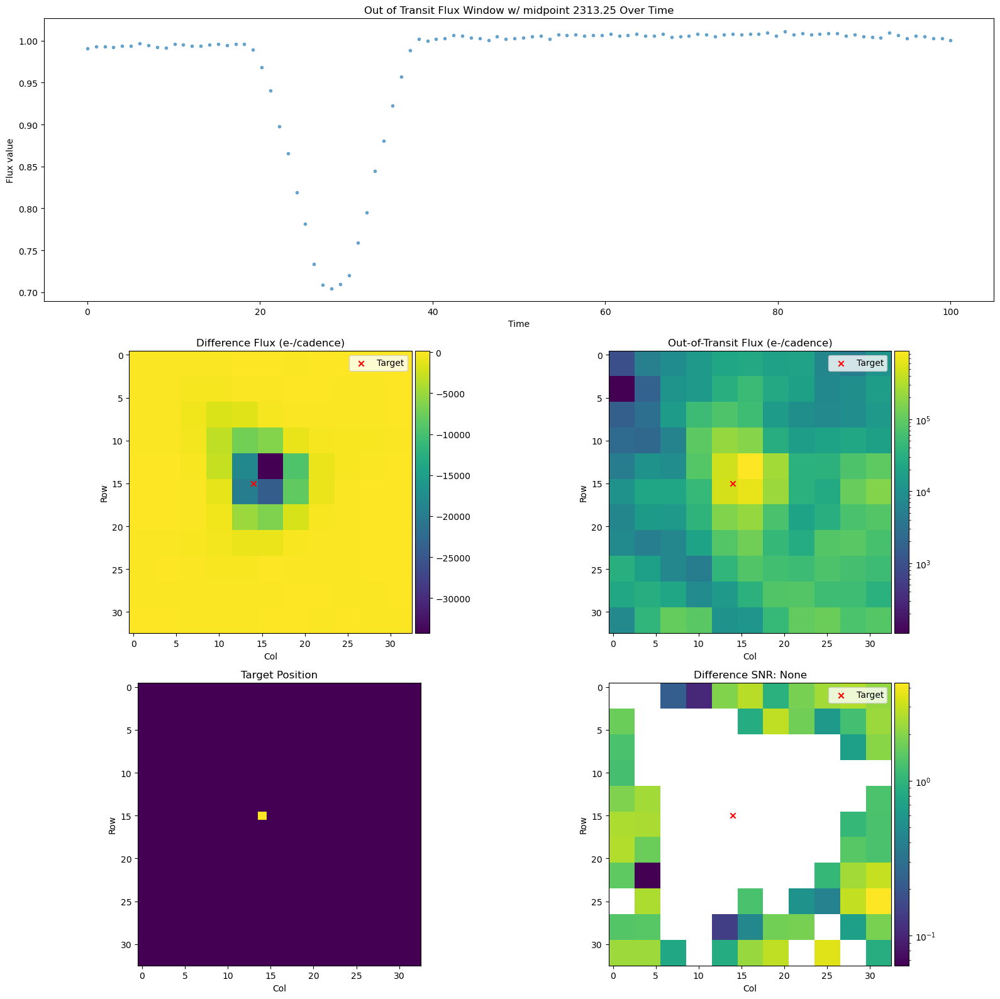

Error in callback <function flush_figures at 0x36aae68e0> (for post_execute):


KeyboardInterrupt: 

In [106]:
tfrec_tce_info = {}
tfrec_dataset = tf.data.TFRecordDataset(tfrec_fp)

for str_record in tfrec_dataset.as_numpy_iterator():
    example = tf.train.Example()
    example.ParseFromString(str_record)

    # get example info
    label = example.features.feature["label"].bytes_list.value[0].decode("utf-8")
    uid = example.features.feature["uid"].bytes_list.value[0].decode("utf-8")
    midpoint = example.features.feature["t"].float_list.value[0]

    # get ephemerides/tce data
    disposition = example.features.feature["disposition"].bytes_list.value[0].decode("utf-8") # fmt: skip
    tce_period = example.features.feature["tce_period"].float_list.value[0]
    tce_model_snr = example.features.feature["tce_model_snr"].float_list.value[0]
    tce_uid = uid.split("_")[0]
    target_id = tce_uid.split("-")[0]
    sector_run = tce_uid.split("S")[-1]
    sector = example.features.feature["sector"].bytes_list.value[0].decode("utf-8")
    tce_duration = example.features.feature["tce_duration"].float_list.value[0]
    tce_time0bk = example.features.feature["tce_time0bk"].float_list.value[0]

    # get flux window
    flux_window = example.features.feature["flux"].float_list.value

    # get diff_imgs
    diff_imgs = []
    for img_feature in ["diff_img", "oot_img", "snr_img", "target_img"]:
        example_img_feature = tf.reshape(
            tf.io.parse_tensor(
                example.features.feature[img_feature].bytes_list.value[0],
                tf.float32,
            ),
            (33, 33),
        ).numpy()
        diff_imgs.append(example_img_feature)

    if tce_uid not in tfrec_tce_info:
        tfrec_tce_info[tce_uid] = {}
        tfrec_tce_info[tce_uid]["it_midpoints"] = []
        tfrec_tce_info[tce_uid]["oot_midpoints"] = []
        tfrec_tce_info[tce_uid]["target_id"] = target_id
        tfrec_tce_info[tce_uid]["tce_uid"] = tce_uid
        tfrec_tce_info[tce_uid]["tce_period"] = tce_period
        tfrec_tce_info[tce_uid]["tce_duration"] = tce_duration
        tfrec_tce_info[tce_uid]["disposition"] = disposition
        tfrec_tce_info[tce_uid]["tce_time0bk"] = tce_time0bk

    if label == "1":
        tfrec_tce_info[tce_uid]["it_midpoints"].append(midpoint)
    else:
        tfrec_tce_info[tce_uid]["oot_midpoints"].append(midpoint)

    t_sr_s_plot_dir = plot_dir / target_id / sector_run / sector
    t_sr_s_plot_dir.mkdir(parents=True, exist_ok=True)

    t_sr_s_ex_plot_dir = t_sr_s_plot_dir / "examples"
    t_sr_s_ex_plot_dir.mkdir(parents=True, exist_ok=True)
    
    plot_fp = t_sr_s_ex_plot_dir / f"t_{round(midpoint, 2)}_{disposition}_{tce_uid}_{label}.png"

    assert label in ("1", "0"), "ERROR: example label {label}: {type(label)} does not meeted expected format"
    plot_ex_flux_window_and_diff_imgs(
                    flux_window=flux_window,
                    diff_imgs=diff_imgs,
                    midpoint=midpoint,
                    is_transit_ex=(True if label == "1" else False),
                    plot_fp=plot_fp,
                    norm=False,
                    snr=None,
                )

In [103]:
tce_tbl_fp = Path(
    "/Users/jochoa4/Projects/exoplanet_transit_classification/ephemeris_tables/preprocessing_tce_tables/tess_2min_tces_dv_s1-s68_all_msectors_11-29-2023_2157_newlabels_nebs_npcs_bds_ebsntps_to_unks.csv"
)

tce_tbl = pd.read_csv(tce_tbl_fp)
tce_tbl = tce_tbl.loc[
        tce_tbl["label"].isin(["EB", "KP", "CP", "NTP", "NEB", "NPC"])
]
tce_tbl = tce_tbl.rename(columns={"uid": "tce_uid", "label": "disposition", "uid": "tce_uid"})

# filter for target, sector_run
target, sector_run = 198242678, "14-19"
t_sr_plot_dir = plot_dir / target / sector_run
t_sr_plot_dir.mkdir(parents=True, exist_ok=True)

t_sr_s_plot_dir = plot_dir / target_id / sector_run / sector
t_sr_s_plot_dir.mkdir(parents=True, exist_ok=True)

t_sr_groups = tce_tbl.groupby(["target_id", "sector_run"])
filtered_tce_tbl = pd.DataFrame([])

filtered_tce_tbl = pd.concat(
    [filtered_tce_tbl, t_sr_groups.get_group((target, sector_run))]
)
tce_tbl = filtered_tce_tbl

if "-" in sector_run:
    start_sector, end_sector = [
        int(sector) for sector in sector_run.split("-")
    ]
    sector_run_arr = [
        sector for sector in range(start_sector, end_sector + 1)
    ]
else:
    sector_run_arr = [int(sector_run)]

# find light curve data for target, sector_run pair
found_sectors, search_lc_res = lk.search_lightcurve(
    target=f"tic{target}",
    mission="TESS",
    author=("TESS-SPOC", "SPOC"),
    exptime=120,
    cadence="long",
    sector=sector_run_arr,
)
print(f"found_sectors: {found_sectors}")

lcfs = search_lc_res.download_all(
    quality_bitmask="default", flux_column="pdcsap_flux"
)

sector_run_data = tce_tbl

target_sector_run_tce_info = []
for tce_i, tce_data in sector_run_data.iterrows():
    target_sector_run_tce_info.append(
        {
            "tce_time0bk": tce_data["tce_time0bk"],
            "tce_period": tce_data["tce_period"],
            "tce_duration": tce_data["tce_duration"],
            "tce_maxmes": tce_data["tce_maxmes"],
            "tce_maxmesd": tce_data["tce_maxmesd"],
        }
    )

for sector, lcf in zip(found_sectors, lcfs):
    lcf = lk.LightCurve(
                    {"time": np.array(lcf.time.value), "flux": np.array(lcf.flux.value)}
                )  # np array accounts for masked flux
    
    time, flux = lcf.time.value, lcf.flux.value
    ex_in_transit_mask = 
    
    
    _mask_for_lightcurve(time, target_sector_run_tce_info, 3, 7.1)
    sg_in_transit_mask = build_transit_mask_for_lightcurve(time, target_sector_run_tce_info, 2, 7.1)

    # plot lcf w/ transit mask
    plt.figure(figsize=(10,4))
    plt.plot(time, flux, label='Flux', color='black')
    
    #overlay it regions as shaded bands
    plt.fill_between(time, flux.min(), flux.max(),
                     where=ex_in_transit_mask,
                     color='orange', alpha=0.3,
                     label="In Transit")
    
    plt.xticks(np.arange(time.min(), time.max(), 0.25))
    plt.xlabel("Time")
    plt.ylabel("Flux")
    plt.title("Light Curve with In-Transit Regions (Primary or Secondary)")
    plt.legend()
    plt.savefig(t_sr_s_plot_dir / f"s_{sector}_it_mask.png")
    plt.show()

    sector_example_data = []

    # Get tce examples from this sector
    for tce_i, tce_data in sector_run_data.iterrows():
        tfrec_tce_ex_info = tfrec_tce_info[str(tce_data["tce_uid"])]
        if str(tfrec_tce_ex_info["sector"]) == str(sector):
            sector_example_data.append(tfrec_tce_ex_info)
    
    for tce_ex_data in sector_example_data:
        midpoint = tce_ex_data["t"]
        tce_duration = tce_ex_data["tce_duration"]
        duration_days = tce_duration / 24

        s, e = (midpoint - (5 * duration_days / 2)), (midpoint + (5 * duration_days / 2))

        true_window = time[(time >= s) & (time <= e)]

        np.where((time >= s) & (time <= e))



SyntaxError: expected ':' (4064689807.py, line 54)

In [134]:
tce_tbl_fp = Path(
    "/Users/jochoa4/Projects/exoplanet_transit_classification/ephemeris_tables/preprocessing_tce_tables/tess_2min_tces_dv_s1-s68_all_msectors_11-29-2023_2157_newlabels_nebs_npcs_bds_ebsntps_to_unks.csv"
)

tce_tbl = pd.read_csv(tce_tbl_fp)
tce_tbl = tce_tbl.loc[
        tce_tbl["label"].isin(["EB", "KP", "CP", "NTP", "NEB", "NPC"])
]
tce_tbl = tce_tbl.rename(columns={"uid": "tce_uid", "label": "disposition", "uid": "tce_uid"})

# filter for target, sector_run
target, sector_run =  198242678, "14-19"
t_sr_plot_dir = plot_dir / str(target) / sector_run
t_sr_plot_dir.mkdir(parents=True, exist_ok=True)

t_sr_s_plot_dir = plot_dir / target_id / sector_run / sector
t_sr_s_plot_dir.mkdir(parents=True, exist_ok=True)

t_sr_groups = tce_tbl.groupby(["target_id", "sector_run"])
filtered_tce_tbl = pd.DataFrame([])

filtered_tce_tbl = pd.concat(
    [filtered_tce_tbl, t_sr_groups.get_group((target, sector_run))]
)

if "-" in sector_run:
    start_sector, end_sector = [
        int(sector) for sector in sector_run.split("-")
    ]
    sector_run_arr = [
        sector for sector in range(start_sector, end_sector + 1)
    ]
else:
    sector_run_arr = [int(sector_run)]

# find light curve data for target, sector_run pair
search_lc_res = lk.search_lightcurve(
    target=f"tic{target}",
    mission="TESS",
    author=("TESS-SPOC", "SPOC"),
    exptime=120,
    cadence="long",
    sector=sector_run_arr,
)

/var/folders/_z/srkh35f94rd_6jrkc3kv29hm0000gp/T/ipykernel_60087/4172811581.py:5: DtypeWarning: Columns (364,366,367,370,371) have mixed types. Specify dtype option on import or set low_memory=False.
  tce_tbl = pd.read_csv(tce_tbl_fp)


In [135]:
search_lc_res[0].mission
found_sectors = []
for lc_res in search_lc_res:
    found_sectors.append(lc_res.mission[0].split(' ')[-1])

In [136]:
found_sectors

['14', '16', '17', '18', '19']

In [137]:
lcfs = search_lc_res.download_all(
    quality_bitmask="default", flux_column="pdcsap_flux"
)

In [138]:
lcfs

LightCurveCollection of 5 objects:
    0: <TessLightCurve LABEL="TIC 198242678" SECTOR=14 AUTHOR=SPOC FLUX_ORIGIN=pdcsap_flux>
    1: <TessLightCurve LABEL="TIC 198242678" SECTOR=16 AUTHOR=SPOC FLUX_ORIGIN=pdcsap_flux>
    2: <TessLightCurve LABEL="TIC 198242678" SECTOR=17 AUTHOR=SPOC FLUX_ORIGIN=pdcsap_flux>
    3: <TessLightCurve LABEL="TIC 198242678" SECTOR=18 AUTHOR=SPOC FLUX_ORIGIN=pdcsap_flux>
    4: <TessLightCurve LABEL="TIC 198242678" SECTOR=19 AUTHOR=SPOC FLUX_ORIGIN=pdcsap_flux>

len_lcf_diff: 0.9555375604454639
len_np_lcf: 18424
LCF for: S14


NameError: name 'resampled_time' is not defined

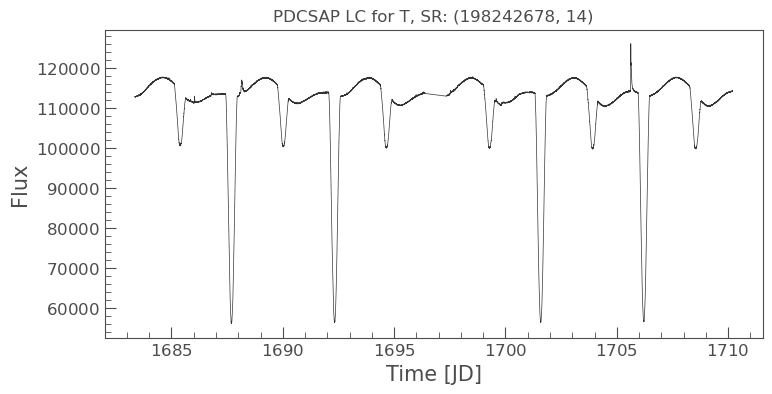

In [145]:
for sector, lcf in zip(found_sectors, lcfs):
    
    lcf = lk.LightCurve({"time": np.array(lcf.time.value), "flux": np.array(lcf.flux.value)})
    print(f"len_np_lcf: {len(lcf.time.value)}")
    time, flux = lcf.time.value, lcf.flux.value
    print(f"LCF for: S{sector}")
    ax = lcf.plot()
    ax.set_title(f"PDCSAP LC for T, SR: ({target}, {sector})")

    interp_f = interp1d(
        time, flux, kind="nearest", bounds_error=False, fill_value="extrapolate"
    )

    resampled_flux = f(resampled_time)
    print(f"interp_f: {len(interp_f)}")
    interp_lcf = lk.LightCurve({"time": time, "flux": np.array(interp_f)})
    ax = interp_lcf.plot()
    ax.set_title(f"Interpolate PDCSAP LC for T, SR: ({target}, {sector})")


    # for tce_i, tce_data in filtered_tce_tbl.iterrows():
        

    
